In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import datetime

In [6]:
path = '/Users/nautim/Desktop/CEU DNDS/Winter 22:23/Diving into public space/data_project/combined_cleaned/' # use your path

In [7]:
terror_nodups = pd.read_csv(path+'terror_nodups_full.csv', index_col=0)
terror_nodups.drop(columns=['Unnamed: 0'], inplace=True)

/var/folders/6h/3knkk6m91213bg2g5qgpp8h80000gn/T/ipykernel_64975/3772691900.py:1: DtypeWarning: Columns (36) have mixed types. Specify dtype option on import or set low_memory=False.
  terror_nodups = pd.read_csv(path+'terror_nodups_full.csv', index_col=0)


In [8]:
terror_nodups.columns

Index(['id', 'author_id', 'created_at', 'edit_history_tweet_ids', 'lang',
       'in_reply_to_user_id', 'conversation_id', 'text', 'reply_settings',
       'possibly_sensitive', 'place_id', 'place_type', 'coord', 'media_keys',
       'retweeted_id', 'quoted_id', 'replied_id', 'url', 'expanded_url',
       'unwound_url', 'title_url', 'description_url', 'mention_name',
       'hashtags', 'annotations', 'retweet_count', 'reply_count', 'like_count',
       'quote_count', 'impression_count', 'name', 'username',
       'user_created_at', 'location', 'verified', 'description',
       'user_followers_count', 'user_following_count', 'user_tweet_count',
       'user_listed_count', 'dataset', 'text_tokenized', 'text_lemmitized',
       'tokens_merged', 'text_stemm', 'sentiment_vader', 'sentiment_textblob',
       'sentiment_vader_cat', 'sentiment_textblob_cat', 'date', 'sentiment_tf',
       'not_ideological', 'ideological', 'topic_BERT'],
      dtype='object')

In [1]:
# networks of hashtags

In [10]:
terror_nodups.hashtags.isna().sum()

95451

In [23]:
hashtags_data = terror_nodups[['hashtags', 'created_at', 'dataset']].dropna().reset_index(drop=True)

In [24]:
hashtags_data.created_at = pd.to_datetime(hashtags_data.created_at)
hashtags_data.created_at = hashtags_data.created_at.dt.date

In [25]:
hashtags_data['hashtags'] = hashtags_data['hashtags'].apply(lambda x: x.split(' '))

In [35]:
# create edges if two hashtags are used in the same row (tweet)

edges = []
for i in range(len(hashtags_data)):
    if len(hashtags_data.hashtags[i]) > 1:
        for j in range(len(hashtags_data.hashtags[i])):
            for k in range(j+1, len(hashtags_data.hashtags[i])):
                edges.append((hashtags_data.hashtags[i][j], hashtags_data.hashtags[i][k], hashtags_data.created_at[i], hashtags_data.dataset[i]))

In [37]:
# from edges to dataframe 
edges_df = pd.DataFrame(edges, columns=['hashtag1', 'hashtag2', 'date', 'dataset'])


In [72]:
# add value counts to edges_df
edges_df['count'] = edges_df.groupby(['hashtag1', 'hashtag2', 'date', 'dataset'])['hashtag1'].transform('count')

In [74]:
edges_df['hashtag1'] = edges_df['hashtag1'].apply(lambda x: x.lower())
edges_df['hashtag2'] = edges_df['hashtag2'].apply(lambda x: x.lower())

In [75]:
# create network from edges dataframe duplicates being a weight
G = nx.from_pandas_edgelist(edges_df, 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])

In [76]:
# create a list of nodes with their degree 
degree = list(G.degree())
degree_df = pd.DataFrame(degree, columns=['hashtag', 'degree'])

In [77]:
# sort by degree 
degree_df.sort_values(by='degree', ascending=False, inplace=True)
degree_df.head()

,hashtag,degree
1,france,4599
211,islam,2264
52,terrorisme,1572
19,macron,1271
49,racisme,989


In [83]:
print(f'This network has {G.number_of_edges()} edges and {G.number_of_nodes()} nodes.')

This network has 62554 edges and 8677 nodes.


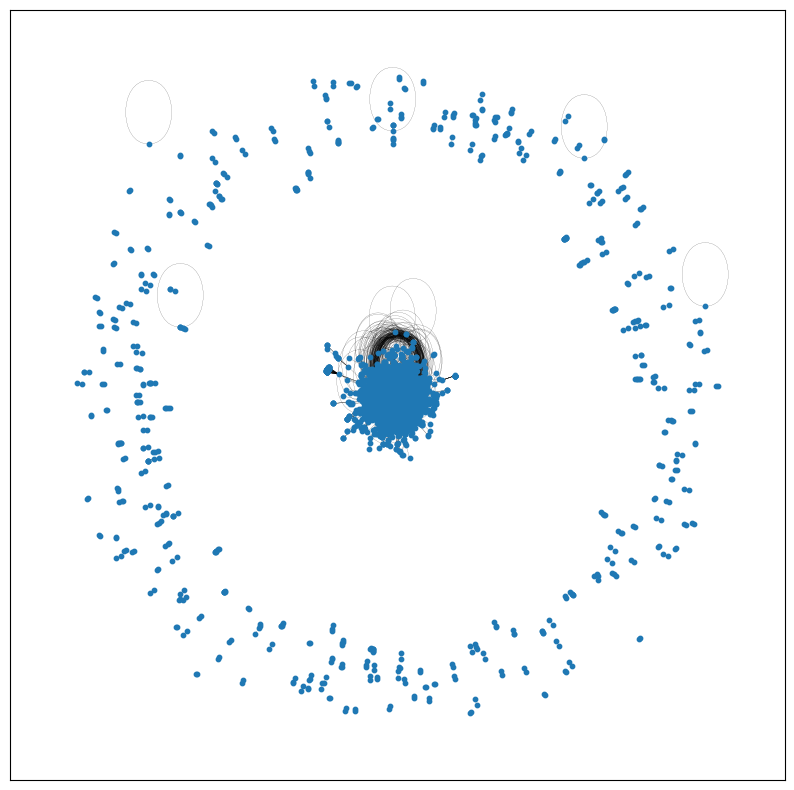

In [84]:
# plot network 
plt.figure(figsize=(10,10))
nx.draw_networkx(G, with_labels=False, node_size=10, width=0.1)
plt.show()

In [87]:
# subset only the giant component
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)

The giant component has 61898 edges and 8026 nodes.


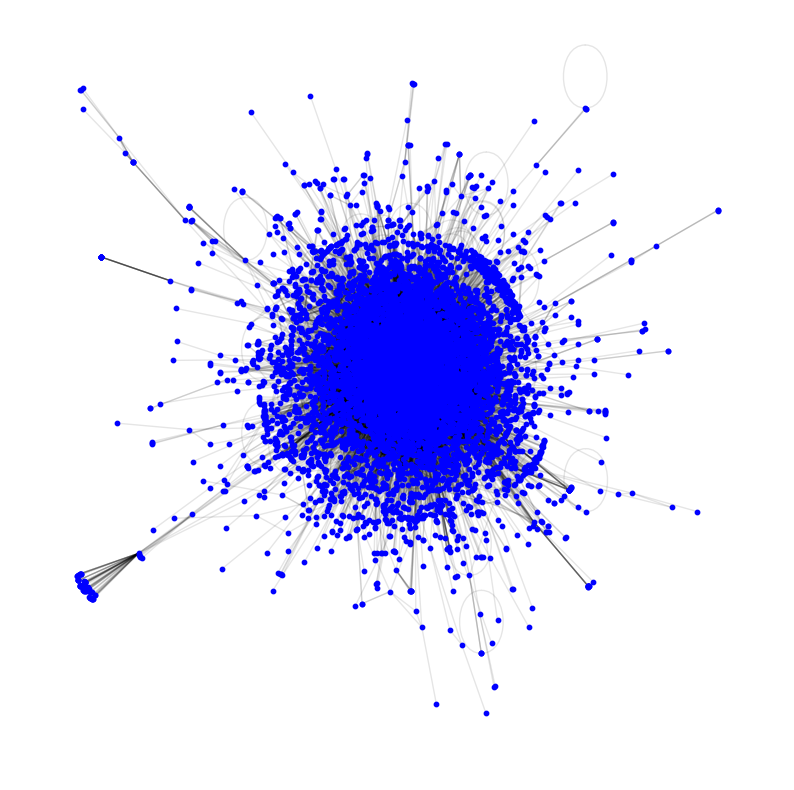

In [88]:
# plot the giant component 
G0 = G.subgraph(Gcc[0])
print(f'The giant component has {G0.number_of_edges()} edges and {G0.number_of_nodes()} nodes.')

# plot the giant component
plt.figure(figsize=(10,10))
pos = nx.spring_layout(G0)
nx.draw_networkx_nodes(G0, pos, node_size=10, node_color='blue')
nx.draw_networkx_edges(G0, pos, alpha=0.1)
plt.axis('off')
plt.show()

In [ ]:
unique_dataset = edges_df.dataset.unique()

for dataset in unique_dataset:
    G = nx.from_pandas_edgelist(edges_df[edges_df.dataset==dataset], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
    G0 = G.subgraph(Gcc[0])
    print(f'The giant component of {dataset} has {G0.number_of_edges()} edges and {G0.number_of_nodes()} nodes.')
    plt.figure(figsize=(10,10))
    pos = nx.spring_layout(G0)
    nx.draw_networkx_nodes(G0, pos, node_size=10, node_color='blue')
    nx.draw_networkx_edges(G0, pos, alpha=0.1)
    plt.axis('off')
    plt.show()

In [89]:
unique_dataset = edges_df.dataset.unique()

In [90]:
unique_dataset

array(['terror231222', 'terror230421', 'terror291020', 'terror281019'],
      dtype=object)

In [172]:
date1 = datetime.date(2022, 12, 23)

G1 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset=='terror231222')&(edges_df.date<date1)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
G2 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset=='terror231222')&(edges_df.date==date1)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
G3 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset=='terror231222')&(edges_df.date>date1)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])

In [167]:
print(f'This network has {G1.number_of_edges()} edges and {G1.number_of_nodes()} nodes.')
print(f'This network has {G2.number_of_edges()} edges and {G2.number_of_nodes()} nodes.')
print(f'This network has {G3.number_of_edges()} edges and {G3.number_of_nodes()} nodes.')

This network has 5755 edges and 1089 nodes.
This network has 1002 edges and 261 nodes.
This network has 4611 edges and 899 nodes.


In [173]:
# delete self loops
G1.remove_edges_from(nx.selfloop_edges(G1))
G2.remove_edges_from(nx.selfloop_edges(G2))
G3.remove_edges_from(nx.selfloop_edges(G3))

In [176]:
# plot the giant component 
Gcc1 = sorted(nx.connected_components(G1), key=len, reverse=True)
Gcc2 = sorted(nx.connected_components(G2), key=len, reverse=True)
Gcc3 = sorted(nx.connected_components(G3), key=len, reverse=True)

G01 = G1.subgraph(Gcc1[0])
G02 = G2.subgraph(Gcc2[0])
G03 = G3.subgraph(Gcc3[0])

print(f'The giant component has {G01.number_of_edges()} edges and {G01.number_of_nodes()} nodes.')
print(f'The giant component has {G02.number_of_edges()} edges and {G02.number_of_nodes()} nodes.')
print(f'The giant component has {G03.number_of_edges()} edges and {G03.number_of_nodes()} nodes.')

The giant component has 5576 edges and 934 nodes.
The giant component has 937 edges and 211 nodes.
The giant component has 4455 edges and 787 nodes.


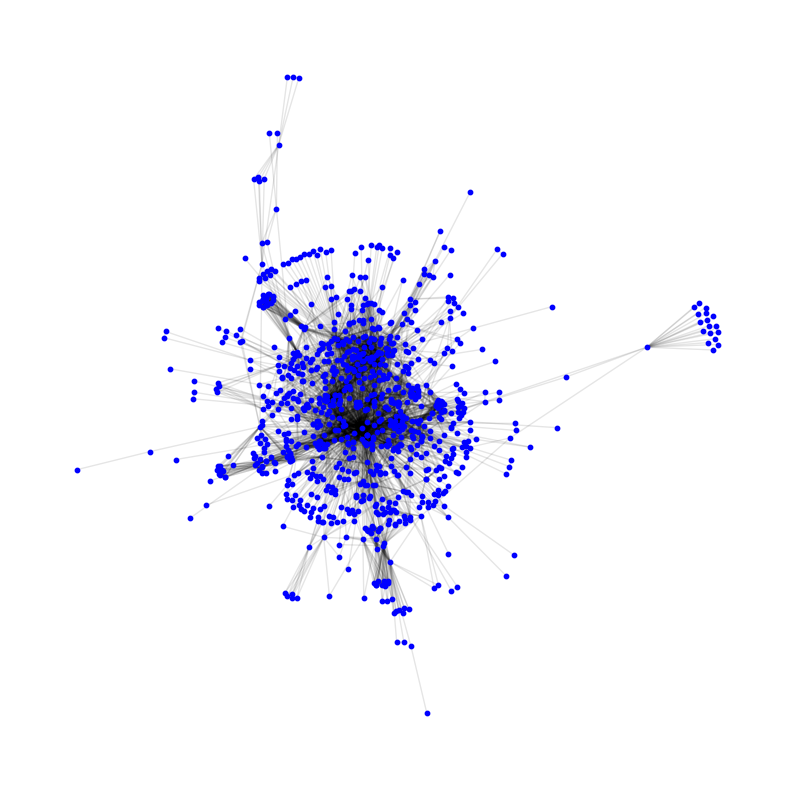

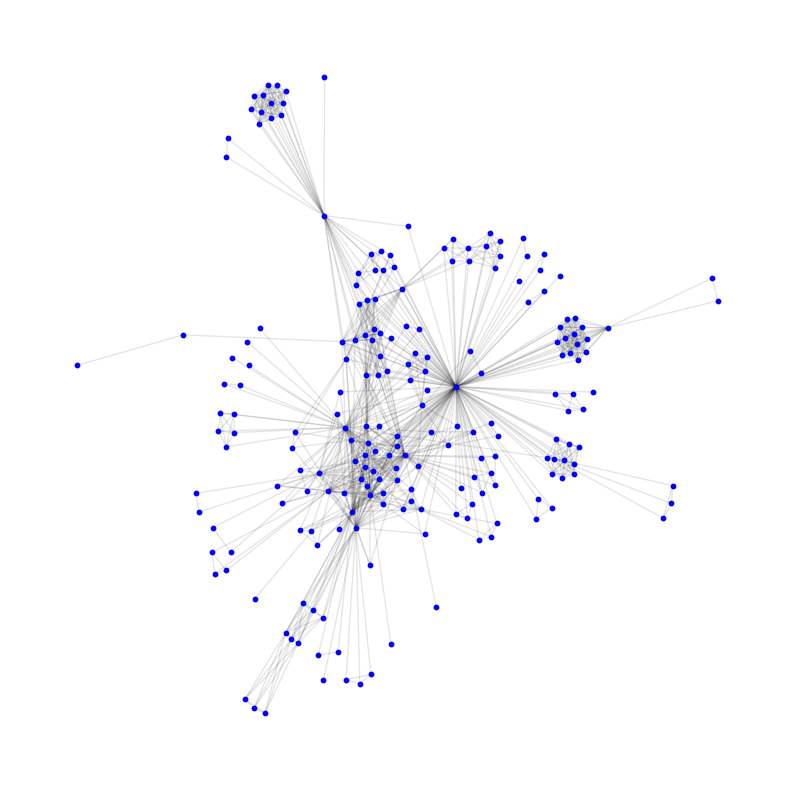

(-0.6356348553299904,
 0.6830074945092202,
 -0.8323399421572685,
 1.1741137501597403)

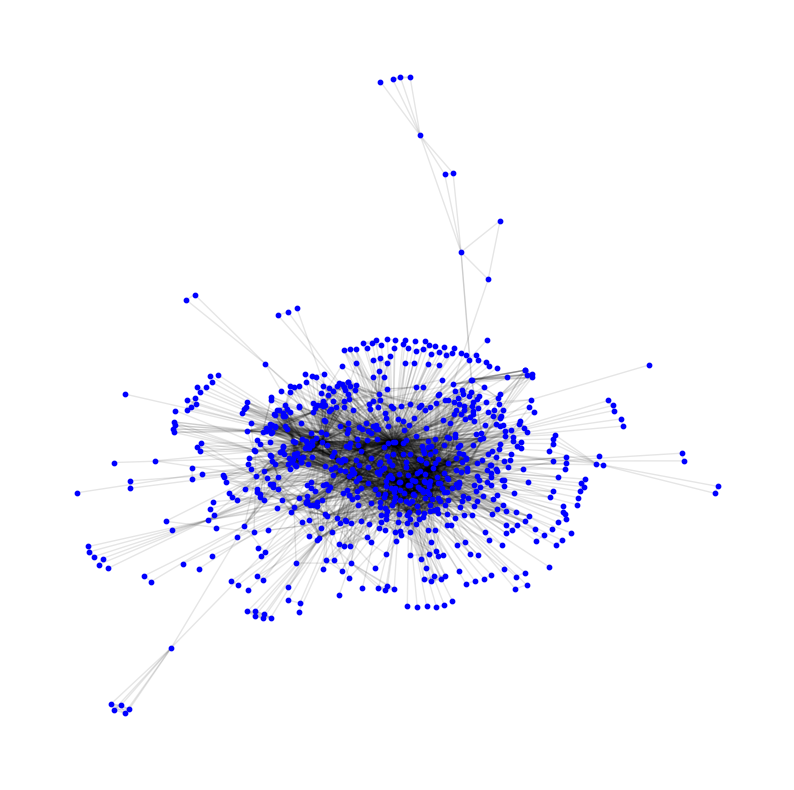

In [170]:
plt.figure(figsize=(10,10))
pos = nx.spring_layout(G01)
nx.draw_networkx_nodes(G01, pos, node_size=10, node_color='blue')
nx.draw_networkx_edges(G01, pos, alpha=0.1)
plt.axis('off')
plt.show()

plt.figure(figsize=(10,10))
pos = nx.spring_layout(G02)
nx.draw_networkx_nodes(G02, pos, node_size=10, node_color='blue')
nx.draw_networkx_edges(G02, pos, alpha=0.1)
plt.axis('off')
plt.show()

plt.figure(figsize=(10,10))
pos = nx.spring_layout(G03)
nx.draw_networkx_nodes(G03, pos, node_size=10, node_color='blue')
nx.draw_networkx_edges(G03, pos, alpha=0.1)
plt.axis('off')

The giant component has 618 edges and 74 nodes.
The giant component has 477 edges and 69 nodes.
The giant component has 492 edges and 56 nodes.


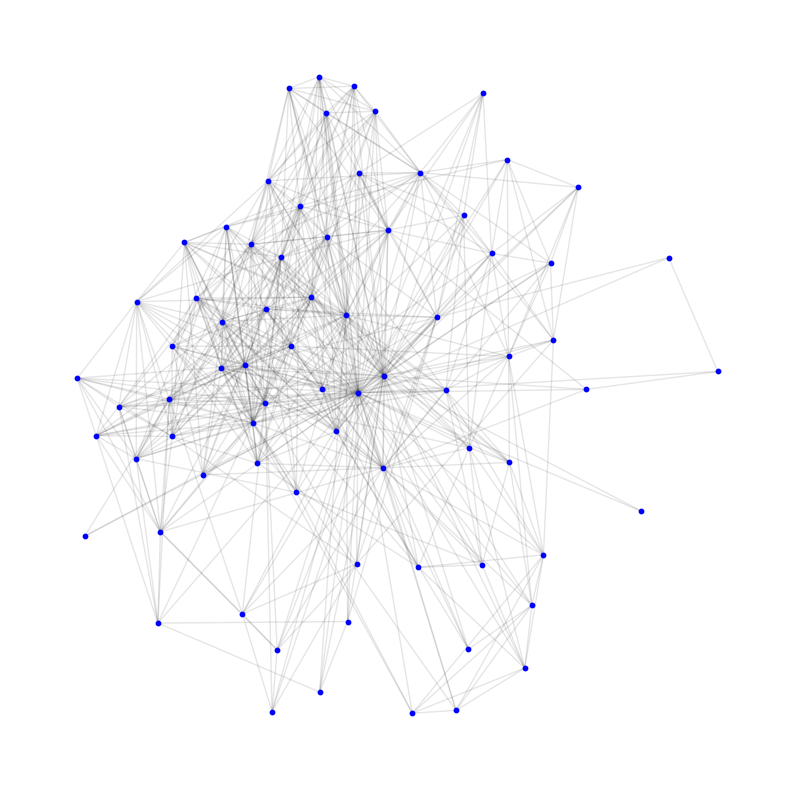

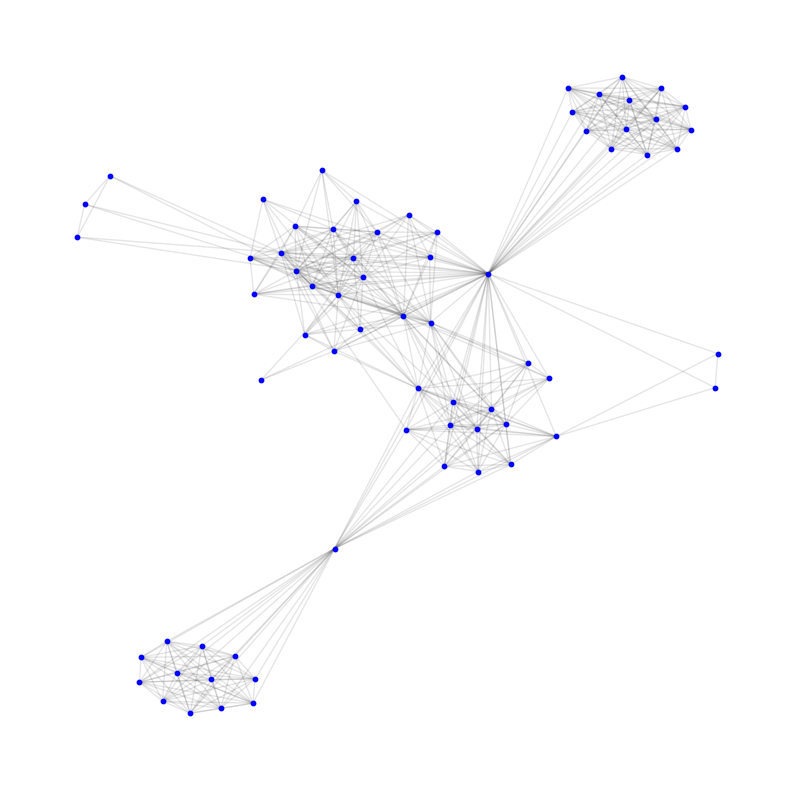

(-1.1884256274059066,
 0.9829554122240639,
 -1.0876756253832385,
 1.0249678489544172)

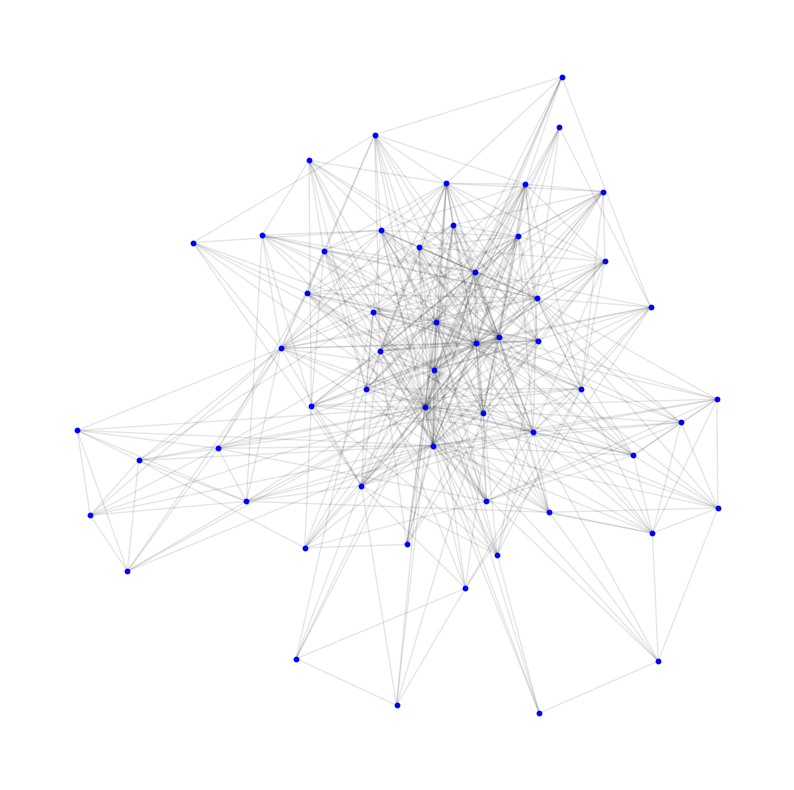

In [177]:
# plot the giant component of nodes with degree
G01 = G01.subgraph([n for n in G01 if G01.degree(n) >= 25])
G02 = G02.subgraph([n for n in G02 if G02.degree(n) >= 10])
G03 = G03.subgraph([n for n in G03 if G03.degree(n) >= 25])

print(f'The giant component has {G01.number_of_edges()} edges and {G01.number_of_nodes()} nodes.')
print(f'The giant component has {G02.number_of_edges()} edges and {G02.number_of_nodes()} nodes.')
print(f'The giant component has {G03.number_of_edges()} edges and {G03.number_of_nodes()} nodes.')

plt.figure(figsize=(10,10))
pos = nx.spring_layout(G01)
nx.draw_networkx_nodes(G01, pos, node_size=10, node_color='blue')
nx.draw_networkx_edges(G01, pos, alpha=0.1)
plt.axis('off')
plt.show()

plt.figure(figsize=(10,10))
pos = nx.spring_layout(G02)
nx.draw_networkx_nodes(G02, pos, node_size=10, node_color='blue')
nx.draw_networkx_edges(G02, pos, alpha=0.1)
plt.axis('off')
plt.show()

plt.figure(figsize=(10,10))
pos = nx.spring_layout(G03)
nx.draw_networkx_nodes(G03, pos, node_size=10, node_color='blue')
nx.draw_networkx_edges(G03, pos, alpha=0.1)
plt.axis('off')

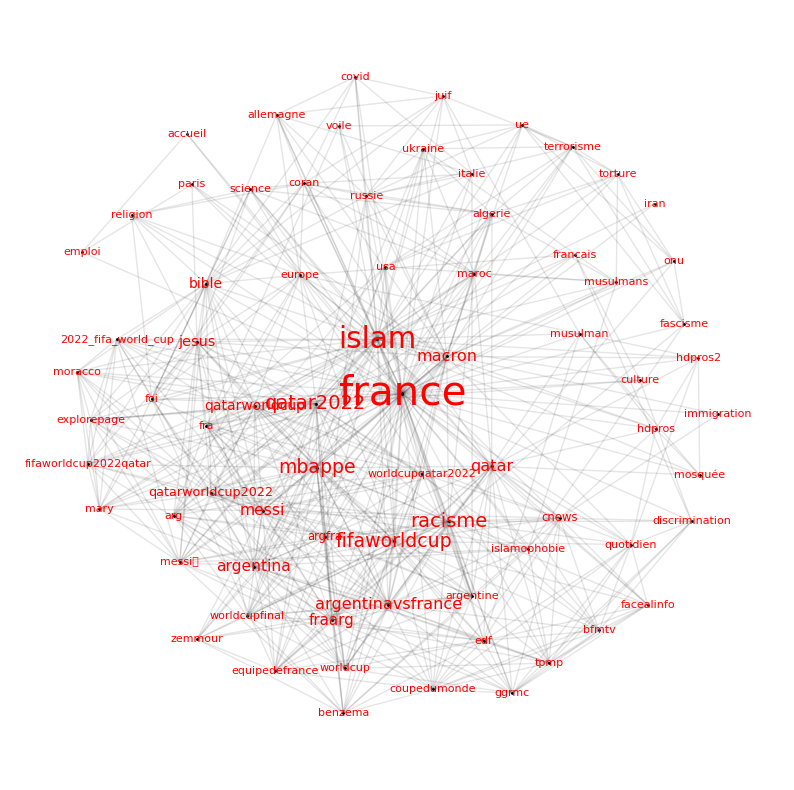

In [179]:
# add label hashtags to nodes 
labels = {}
for node in G01.nodes():
    labels[node] = node

plt.figure(figsize=(10,10))
pos = nx.kamada_kawai_layout(G01)
nx.draw_networkx_nodes(G01, pos, node_size=1, node_color='black')
nx.draw_networkx_edges(G01, pos, alpha=0.1)

degrees = dict(G01.degree())
for node, degree in degrees.items():
    labels[node] = node
    font_size = max(8, degree*0.4)
    nx.draw_networkx_labels(G01, pos, {node: node}, font_size=font_size, font_color='red')

plt.axis('off');

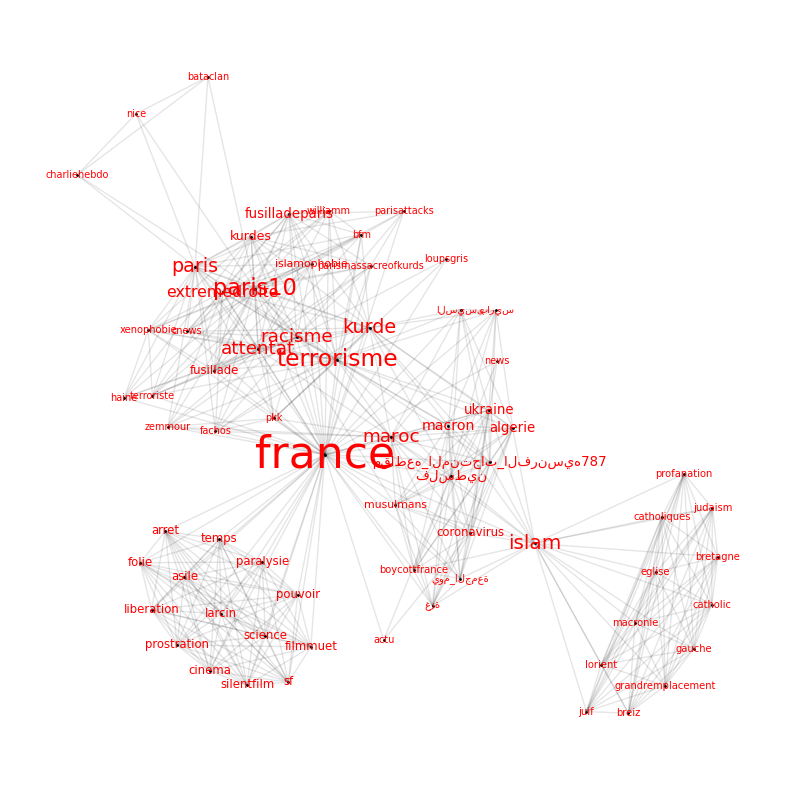

In [180]:
# add label hashtags to nodes 
labels = {}
for node in G02.nodes():
    labels[node] = node

plt.figure(figsize=(10,10))
pos = nx.kamada_kawai_layout(G02)
nx.draw_networkx_nodes(G02, pos, node_size=1, node_color='black')
nx.draw_networkx_edges(G02, pos, alpha=0.1)

degrees = dict(G02.degree())
for node, degree in degrees.items():
    labels[node] = node
    font_size = max(7, degree*0.6)
    nx.draw_networkx_labels(G01, pos, {node: node}, font_size=font_size, font_color='red')

plt.axis('off');

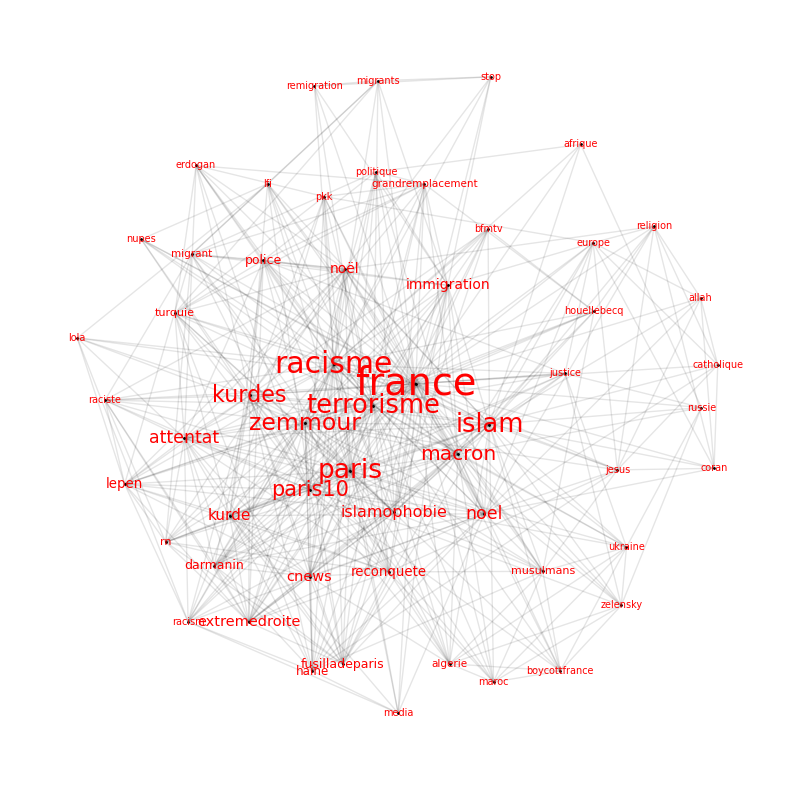

In [181]:
# add label hashtags to nodes 
labels = {}
for node in G03.nodes():
    labels[node] = node

plt.figure(figsize=(10,10))
pos = nx.kamada_kawai_layout(G03)
nx.draw_networkx_nodes(G03, pos, node_size=1, node_color='black')
nx.draw_networkx_edges(G03, pos, alpha=0.1)

degrees = dict(G03.degree())
for node, degree in degrees.items():
    labels[node] = node
    font_size = max(7, degree*0.5)
    nx.draw_networkx_labels(G01, pos, {node: node}, font_size=font_size, font_color='red')

plt.axis('off');

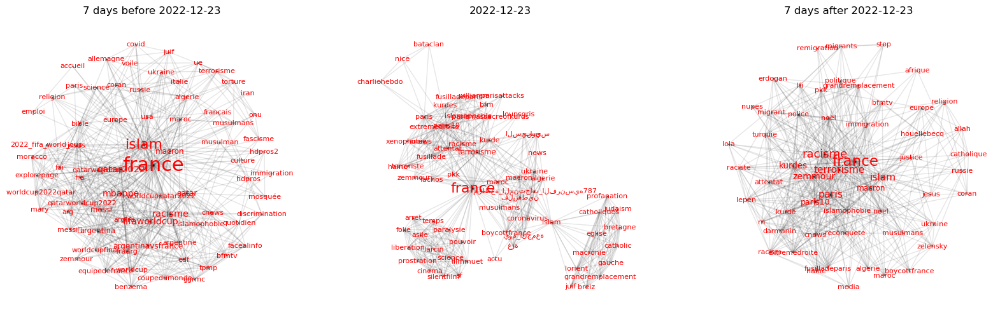

In [182]:
# plot these giant components in one line with a loop

dict_title = {'G01': f'7 days before {date1}', 'G02': f'{date1}', 'G03': f'7 days after {date1}'}

fig, ax = plt.subplots(1, 3, figsize=(20, 6))
for i, G in enumerate([G01, G02, G03]):
    pos = nx.kamada_kawai_layout(G)
    nx.draw_networkx_nodes(G, pos, node_size=0.1, node_color='black', ax=ax[i])
    nx.draw_networkx_edges(G, pos, alpha=0.1, ax=ax[i])
    degrees = dict(G.degree())
    for node, degree in degrees.items():
        labels[node] = node
        font_size = max(8, degree*0.3)
        nx.draw_networkx_labels(G, pos, {node: node}, font_size=font_size, font_color='red', ax=ax[i])
    ax[i].set_title(dict_title[f'G0{i+1}'])
    ax[i].axis('off')

In [185]:
unique_dataset = edges_df.dataset.unique()
dates = [datetime.date(2022, 12, 23), datetime.date(2021, 4, 23), datetime.date(2020, 10, 29), datetime.date(2019, 10, 28)]

In [ ]:
for dataset, date in zip(unique_dataset, dates):



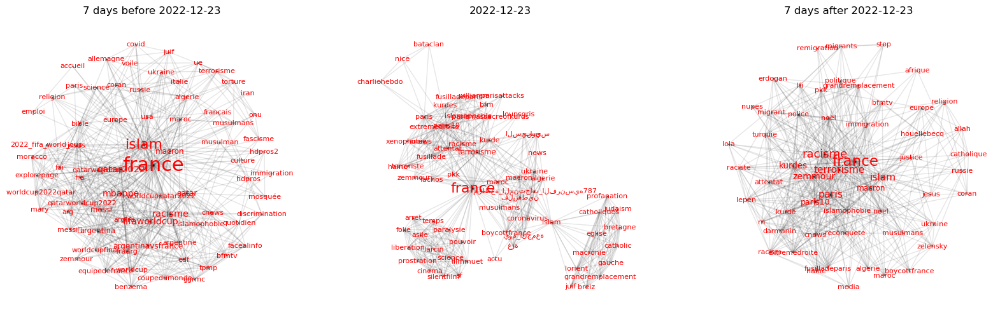

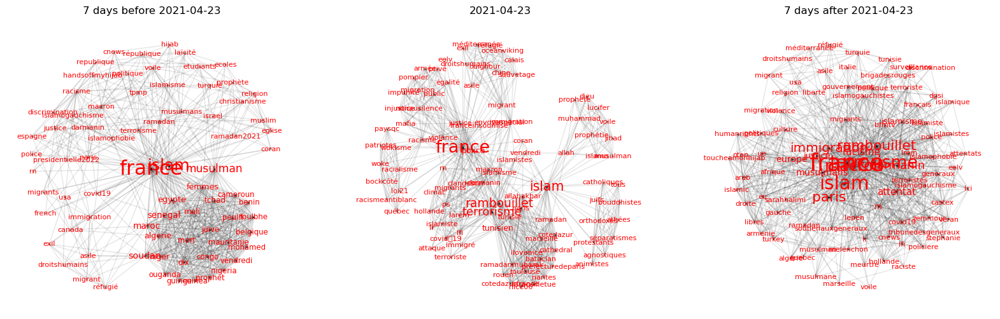

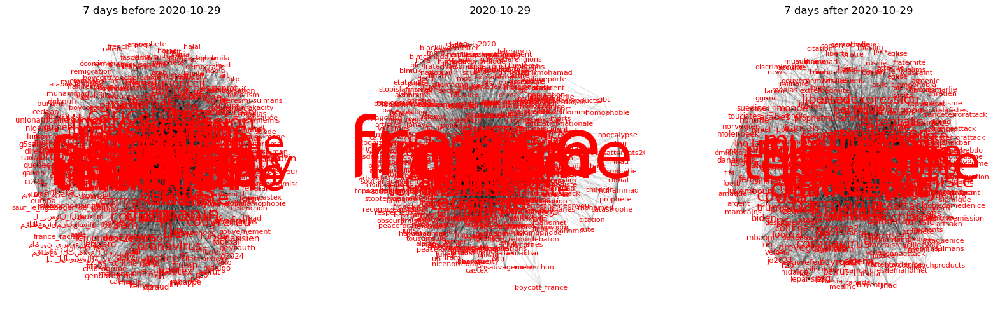

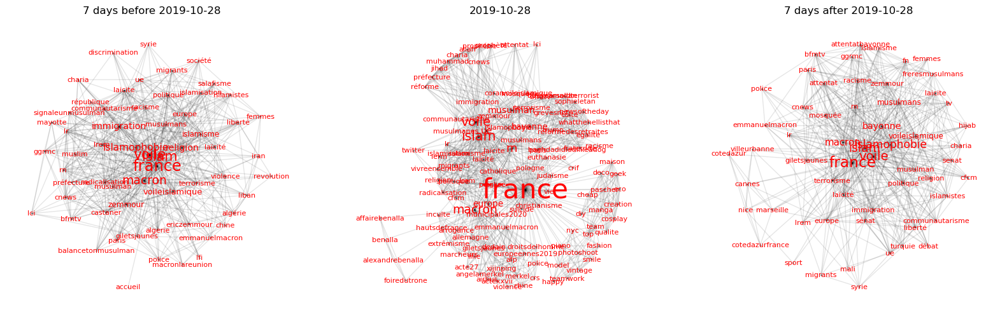

In [189]:
for dataset, date in zip(unique_dataset, dates):
    # create graphs
    G1 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==dataset)&(edges_df.date<date)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    G2 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==dataset)&(edges_df.date==date)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    G3 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==dataset)&(edges_df.date>date)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    
    # remove self-loops and isolate nodes
    G1.remove_edges_from(nx.selfloop_edges(G1))
    G1.remove_nodes_from(list(nx.isolates(G1)))
    G2.remove_edges_from(nx.selfloop_edges(G2))
    G2.remove_nodes_from(list(nx.isolates(G2)))
    G3.remove_edges_from(nx.selfloop_edges(G3))
    G3.remove_nodes_from(list(nx.isolates(G3)))

    # get giant components
    Gcc1 = sorted(nx.connected_components(G1), key=len, reverse=True)
    Gcc2 = sorted(nx.connected_components(G2), key=len, reverse=True)
    Gcc3 = sorted(nx.connected_components(G3), key=len, reverse=True)

    G01 = G1.subgraph(Gcc1[0])
    G02 = G2.subgraph(Gcc2[0])
    G03 = G3.subgraph(Gcc3[0])

    # giant component of nodes with min degree
    G01 = G01.subgraph([n for n in G01 if G01.degree(n) >= 25])
    G02 = G02.subgraph([n for n in G02 if G02.degree(n) >= 10])
    G03 = G03.subgraph([n for n in G03 if G03.degree(n) >= 25])

    # plot these giant components in one line with a loop

    dict_title = {'G01': f'7 days before {date}', 'G02': f'{date}', 'G03': f'7 days after {date}'}
    
    fig, ax = plt.subplots(1, 3, figsize=(20, 6))
    for i, G in enumerate([G01, G02, G03]):
     pos = nx.kamada_kawai_layout(G)
     nx.draw_networkx_nodes(G, pos, node_size=0.1, node_color='black', ax=ax[i])
     nx.draw_networkx_edges(G, pos, alpha=0.1, ax=ax[i])
     degrees = dict(G.degree())
     for node, degree in degrees.items():
         labels[node] = node
         font_size = max(8, degree*0.3)
         nx.draw_networkx_labels(G, pos, {node: node}, font_size=font_size, font_color='red', ax=ax[i])
     ax[i].set_title(dict_title[f'G0{i+1}'])
     ax[i].axis('off')


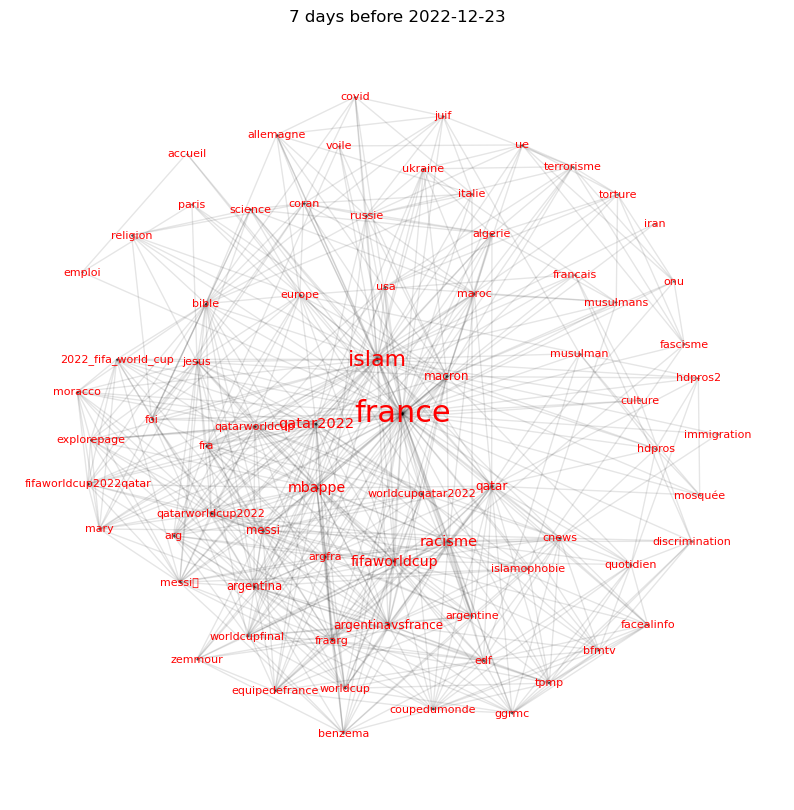

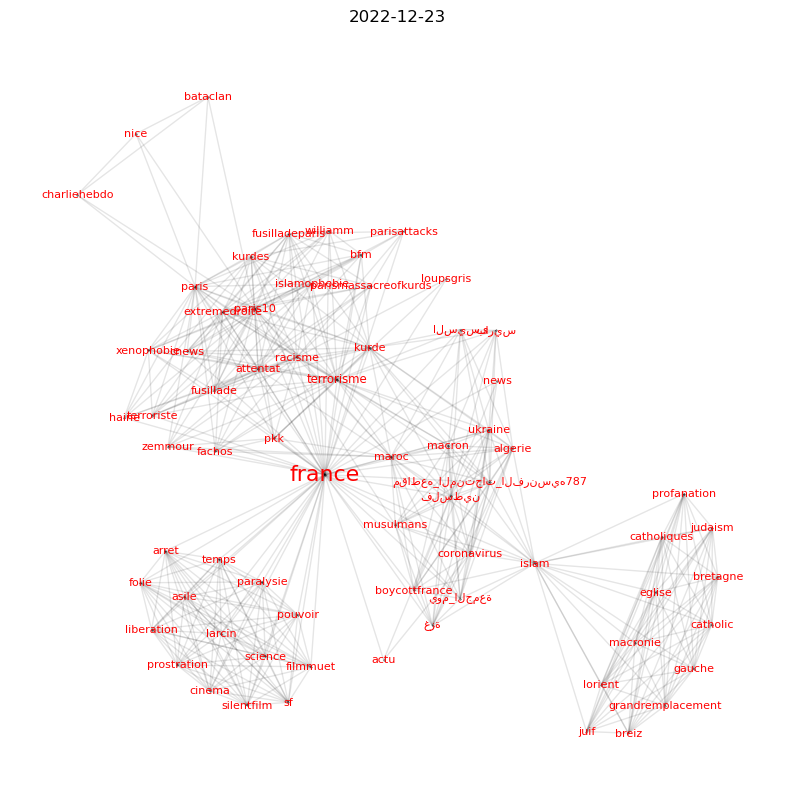

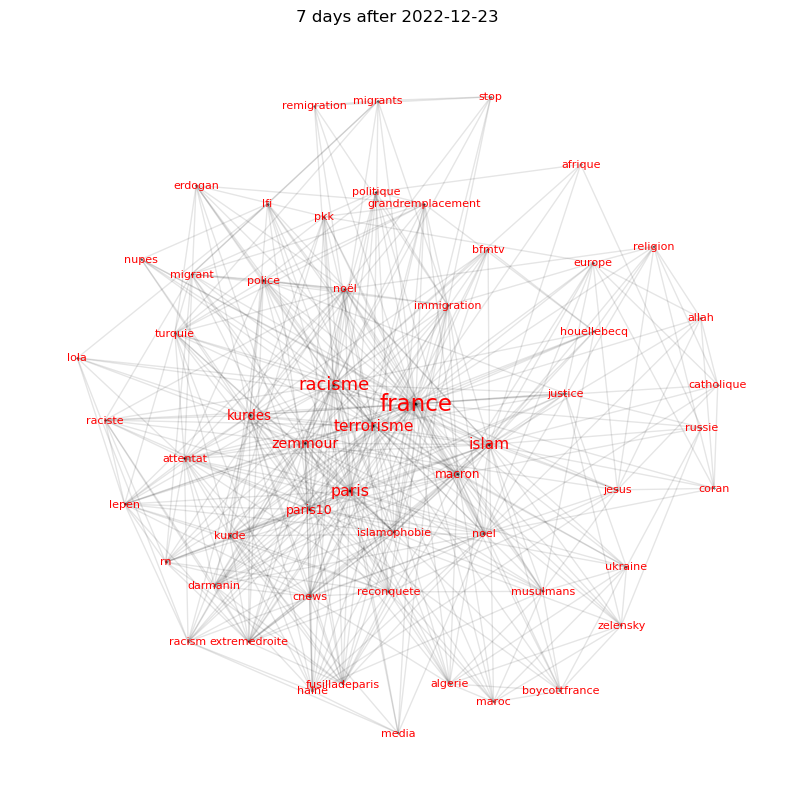

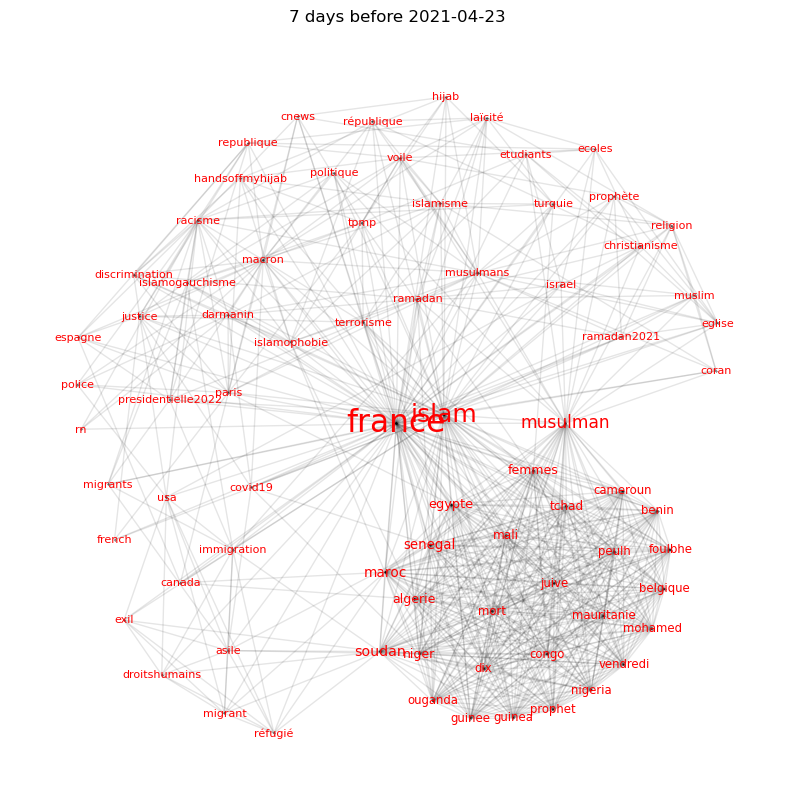

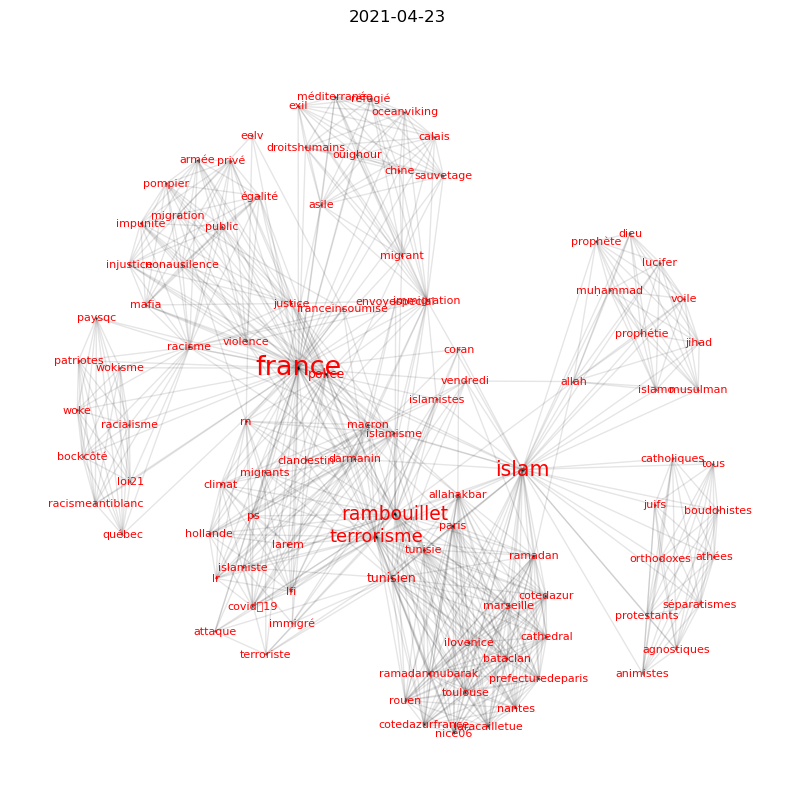

...

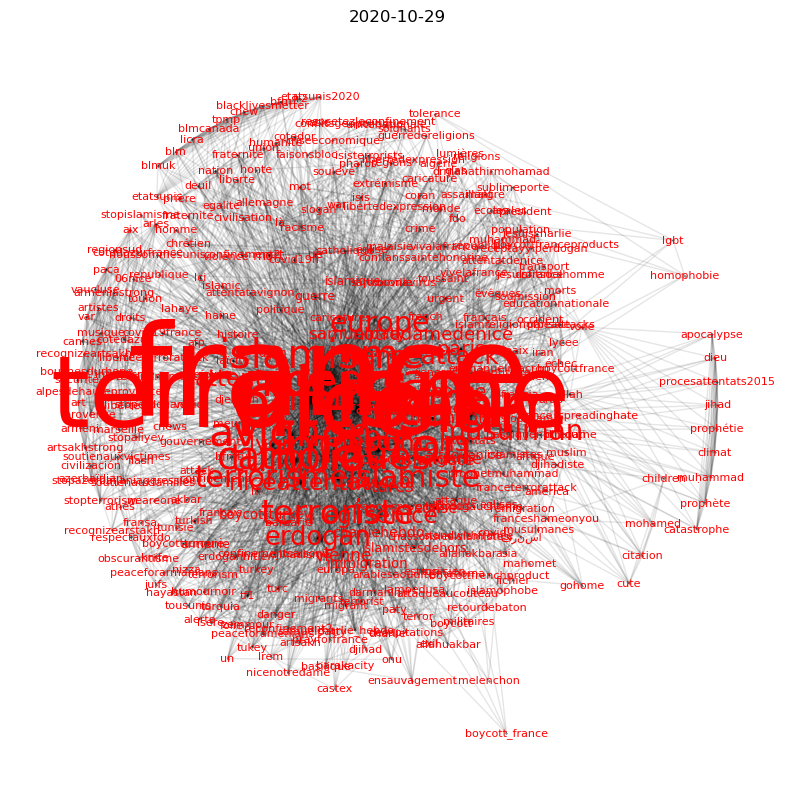

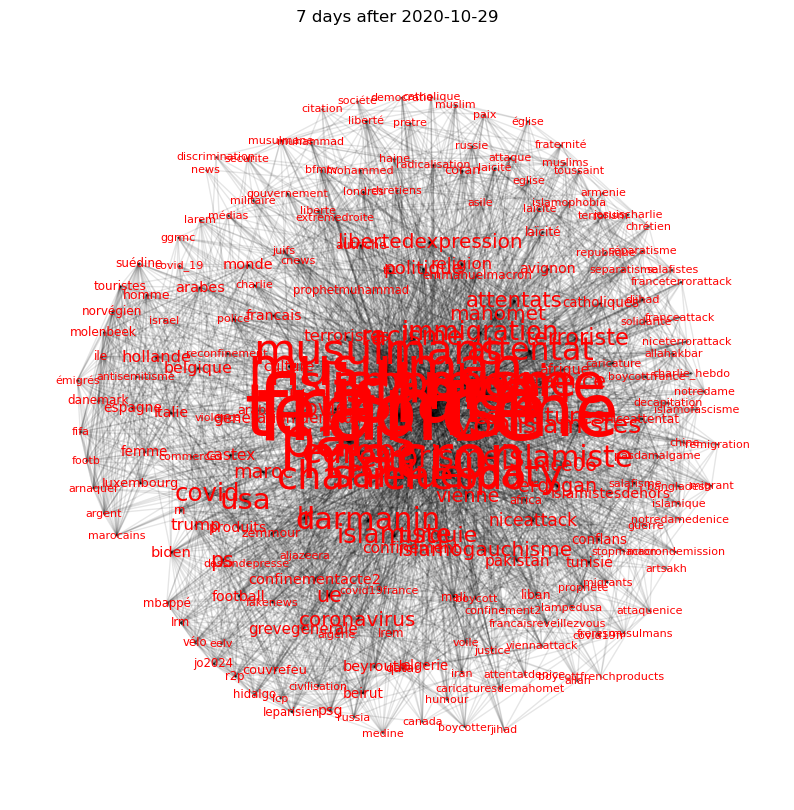

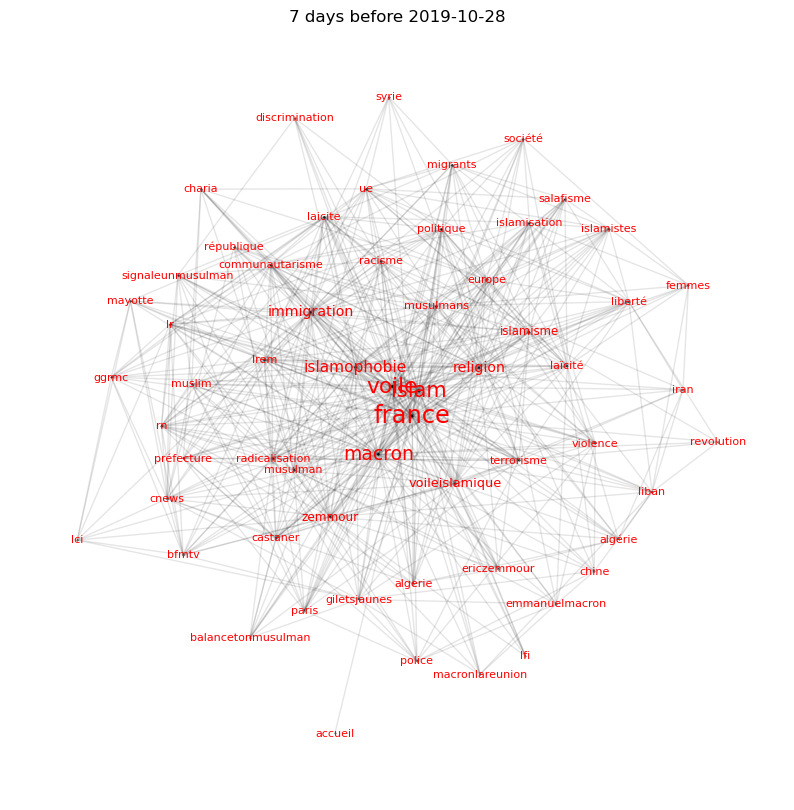

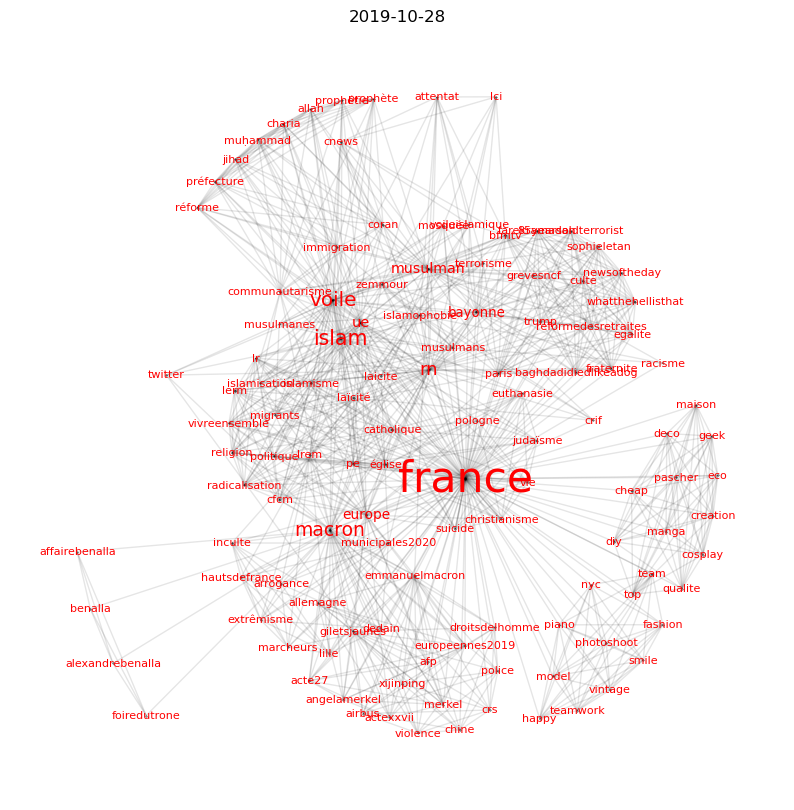

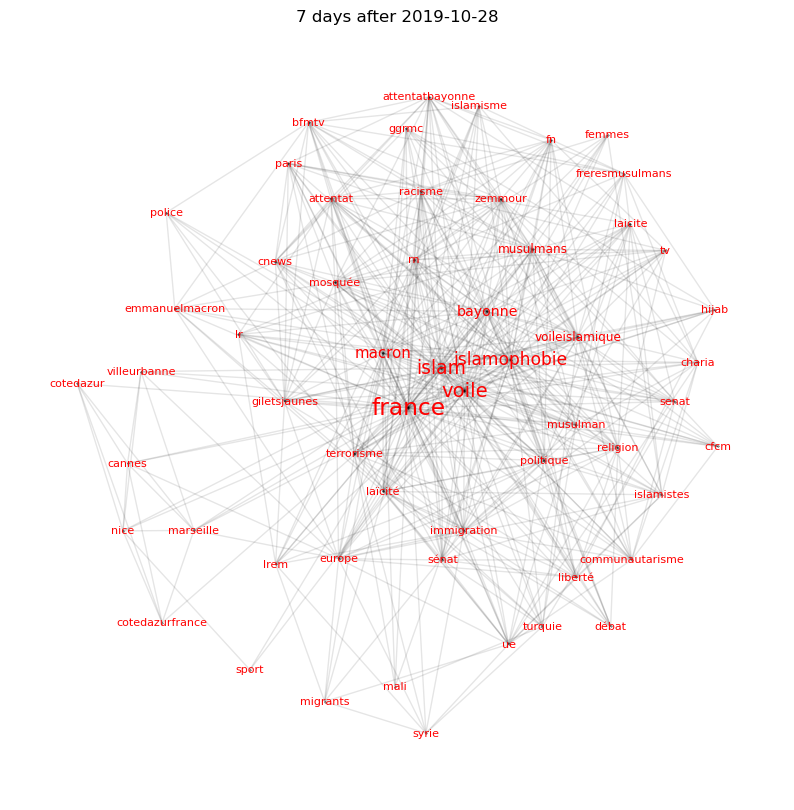

In [191]:
for dataset, date in zip(unique_dataset, dates):
    # create graphs
    G1 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==dataset)&(edges_df.date<date)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    G2 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==dataset)&(edges_df.date==date)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    G3 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==dataset)&(edges_df.date>date)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    
    # remove self-loops and isolate nodes
    G1.remove_edges_from(nx.selfloop_edges(G1))
    G1.remove_nodes_from(list(nx.isolates(G1)))
    G2.remove_edges_from(nx.selfloop_edges(G2))
    G2.remove_nodes_from(list(nx.isolates(G2)))
    G3.remove_edges_from(nx.selfloop_edges(G3))
    G3.remove_nodes_from(list(nx.isolates(G3)))

    # get giant components
    Gcc1 = sorted(nx.connected_components(G1), key=len, reverse=True)
    Gcc2 = sorted(nx.connected_components(G2), key=len, reverse=True)
    Gcc3 = sorted(nx.connected_components(G3), key=len, reverse=True)

    G01 = G1.subgraph(Gcc1[0])
    G02 = G2.subgraph(Gcc2[0])
    G03 = G3.subgraph(Gcc3[0])

    # giant component of nodes with min degree
    G01 = G01.subgraph([n for n in G01 if G01.degree(n) >= 25])
    G02 = G02.subgraph([n for n in G02 if G02.degree(n) >= 10])
    G03 = G03.subgraph([n for n in G03 if G03.degree(n) >= 25])

    # plot these giant components in one line with a loop

    dict_title = {'G01': f'7 days before {date}', 'G02': f'{date}', 'G03': f'7 days after {date}'}

    for i, G in enumerate([G01, G02, G03]):
     plt.figure(figsize=(10,10))
     pos = nx.kamada_kawai_layout(G)
     nx.draw_networkx_nodes(G, pos, node_size=0.1, node_color='black')
     nx.draw_networkx_edges(G, pos, alpha=0.1)
     degrees = dict(G.degree())
     for node, degree in degrees.items():
         labels[node] = node
         font_size = max(8, degree*0.3)
         nx.draw_networkx_labels(G, pos, {node: node}, font_size=font_size, font_color='red')
     plt.title(dict_title[f'G0{i+1}'])
     plt.axis('off')
     plt.show();

Separately for Nice - it was a larger event!

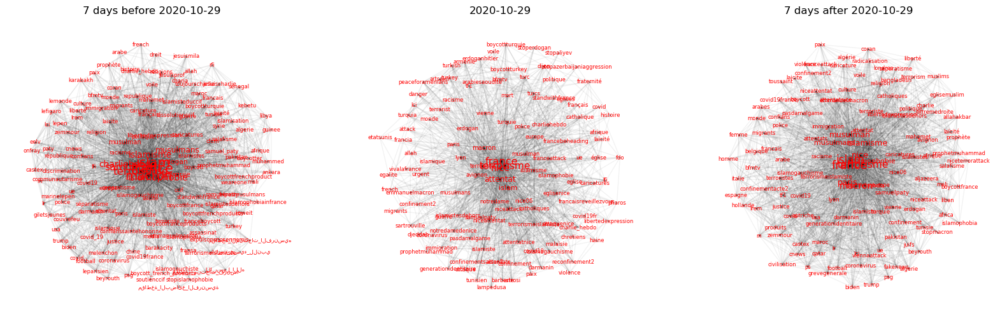

In [219]:
G1 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==unique_dataset[2])&(edges_df.date<dates[2])], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
G2 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==unique_dataset[2])&(edges_df.date==dates[2])], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
G3 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==unique_dataset[2])&(edges_df.date>dates[2])], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    
    # remove self-loops and isolate nodes
G1.remove_edges_from(nx.selfloop_edges(G1))
G1.remove_nodes_from(list(nx.isolates(G1)))
G2.remove_edges_from(nx.selfloop_edges(G2))
G2.remove_nodes_from(list(nx.isolates(G2)))
G3.remove_edges_from(nx.selfloop_edges(G3))
G3.remove_nodes_from(list(nx.isolates(G3)))

    # get giant components
Gcc1 = sorted(nx.connected_components(G1), key=len, reverse=True)
Gcc2 = sorted(nx.connected_components(G2), key=len, reverse=True)
Gcc3 = sorted(nx.connected_components(G3), key=len, reverse=True)

G01 = G1.subgraph(Gcc1[0])
G02 = G2.subgraph(Gcc2[0])
G03 = G3.subgraph(Gcc3[0])

    # giant component of nodes with min degree
G01 = G01.subgraph([n for n in G01 if G01.degree(n) >= 35])
G02 = G02.subgraph([n for n in G02 if G02.degree(n) >= 20])
G03 = G03.subgraph([n for n in G03 if G03.degree(n) >= 35])

    # plot these giant components in one line with a loop

dict_title = {'G01': f'7 days before {dates[2]}', 'G02': f'{dates[2]}', 'G03': f'7 days after {dates[2]}'}
    
fig, ax = plt.subplots(1, 3, figsize=(20, 6))
for i, G in enumerate([G01, G02, G03]):
    pos = nx.kamada_kawai_layout(G)
    nx.draw_networkx_nodes(G, pos, node_size=0.1, node_color='black', ax=ax[i])
    nx.draw_networkx_edges(G, pos, alpha=0.05, ax=ax[i])
    degrees = dict(G.degree())
    for node, degree in degrees.items():
         labels[node] = node
         font_size = max(6, degree*0.1)
         nx.draw_networkx_labels(G, pos, {node: node}, font_size=font_size, font_color='red', ax=ax[i])
    ax[i].set_title(dict_title[f'G0{i+1}'])
    ax[i].axis('off')

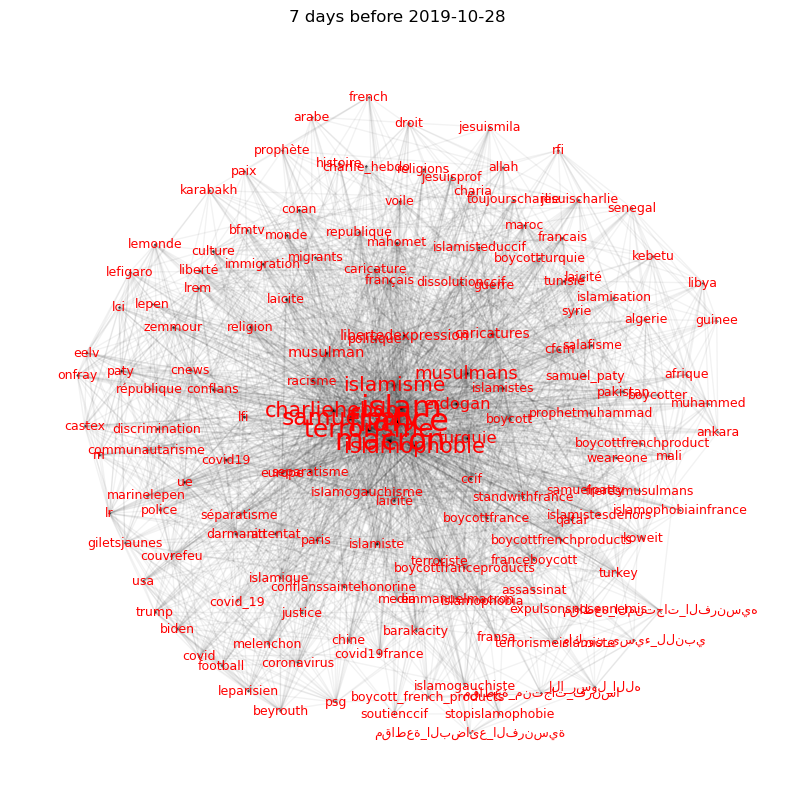

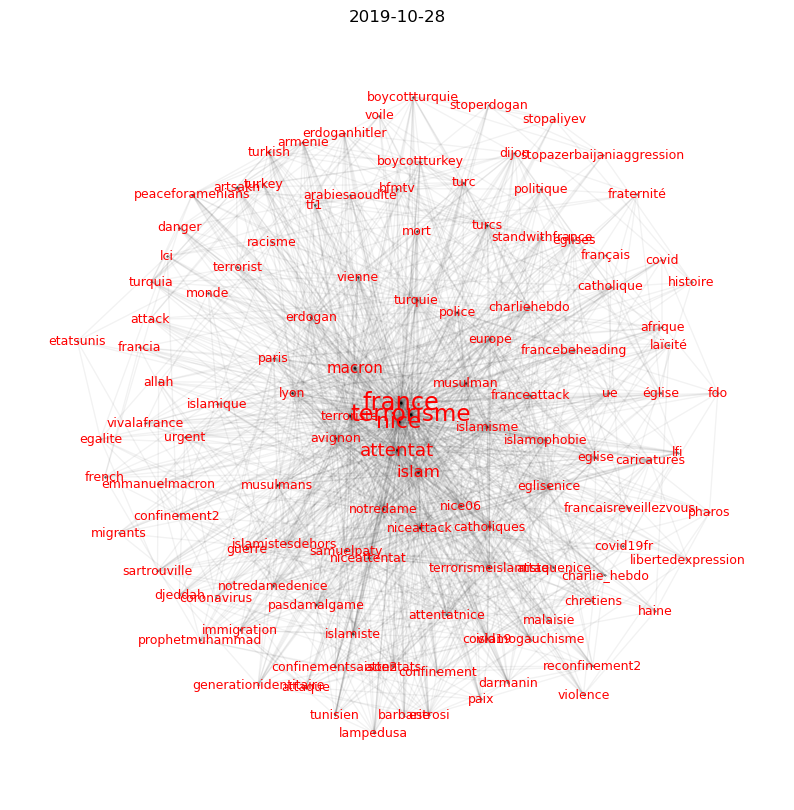

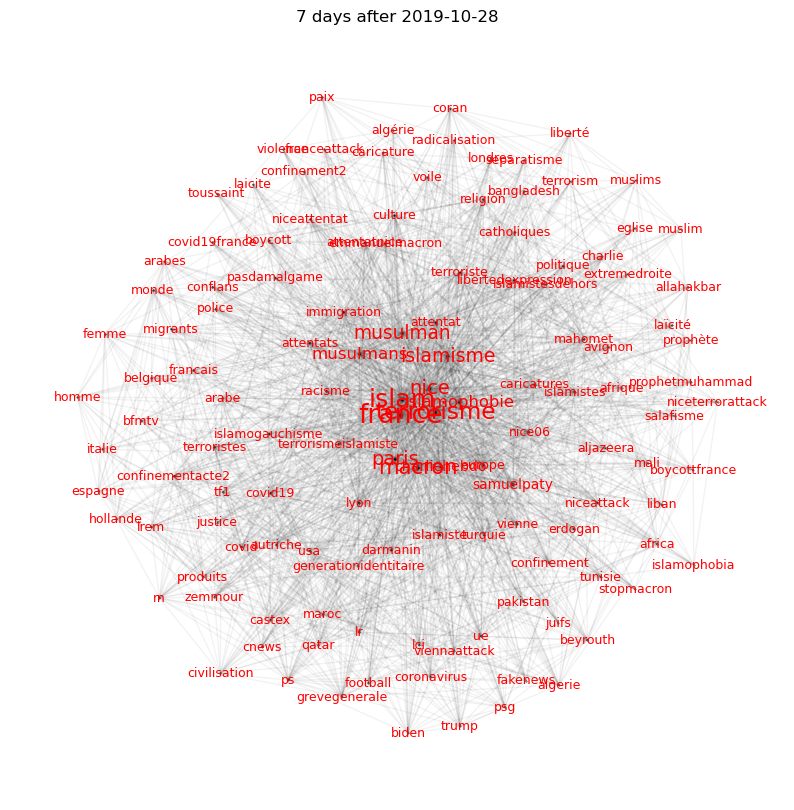

In [213]:
# plot these giant components in one line with a loop

dict_title = {'G01': f'7 days before {date}', 'G02': f'{date}', 'G03': f'7 days after {date}'}

for i, G in enumerate([G01, G02, G03]):
    plt.figure(figsize=(10,10))
    pos = nx.kamada_kawai_layout(G)
    nx.draw_networkx_nodes(G, pos, node_size=0.1, node_color='black')
    nx.draw_networkx_edges(G, pos, alpha=0.05)
    degrees = dict(G.degree())
    for node, degree in degrees.items():
        labels[node] = node
        font_size = max(9, degree*0.15)
        nx.draw_networkx_labels(G, pos, {node: node}, font_size=font_size, font_color='red')
    plt.title(dict_title[f'G0{i+1}'])
    plt.axis('off')
    plt.show();